In [1]:
import torch
import seaborn as sns
import pandas as pd
import csv
from matplotlib import pyplot as plt
import h5py
import numpy as np
from PIL import Image

/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:549: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  return self._float_to_str(self.smallest_subnormal)
/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:549: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <

In [2]:
sim_params_path = "/mnt/home/dmohan/dreams-dm/dreamsdm/data/wdm/WDM_TNG_MW_SB4.txt"

sim_params_df = pd.read_csv(sim_params_path, delimiter = ' ')
print(sim_params_df)
print(sim_params_df.columns)

           WDM       SN1       SN2       AGN
0     0.064895  1.008202  0.674483  0.314740
1     0.469749  0.824793  1.455380  1.295359
2     0.343330  3.826109  0.798417  0.952282
3     0.191186  0.314092  1.217922  3.742622
4     0.239441  2.005988  1.888808  2.661029
...        ...       ...       ...       ...
1019  0.239919  0.630716  0.576254  3.885894
1020  0.190772  1.001588  0.751495  2.792982
1021  0.342851  0.830235  1.363127  0.680412
1022  0.469143  3.789470  0.627979  1.698589
1023  0.064353  0.317130  1.611555  0.431063

[1024 rows x 4 columns]
Index(['WDM', 'SN1', 'SN2', 'AGN'], dtype='object')


Text(0.5, 0, 'M_WDM [keV]')

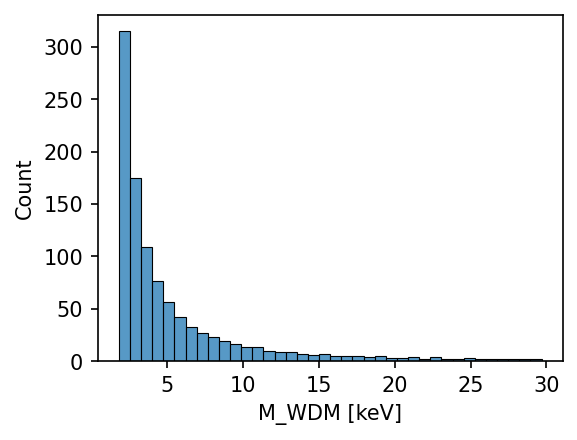

In [3]:
fig, ax = plt.subplots(figsize = ( 4 , 3 ), dpi = 150)
sns.histplot((1/sim_params_df["WDM"]))
ax.set_xlabel('M_WDM [keV]')

In [142]:
# sim_params_df.insert(0, "SimID",["Galaxy_" + str(i) for i in (np.arange(0, 1024,1 ))] )

In [4]:
sim_params_df

,WDM,SN1,SN2,AGN
0,0.064895,1.008202,0.674483,0.314740
1,0.469749,0.824793,1.455380,1.295359
2,0.343330,3.826109,0.798417,0.952282
3,0.191186,0.314092,1.217922,3.742622
4,0.239441,2.005988,1.888808,2.661029
...,...,...,...,...
1019,0.239919,0.630716,0.576254,3.885894
1020,0.190772,1.001588,0.751495,2.792982
1021,0.342851,0.830235,1.363127,0.680412
1022,0.469143,3.789470,0.627979,1.698589


In [146]:
# # galaxy_path = "/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/" # +SimID.hdf5
# sim_params_df.to_csv('/mnt/home/dmohan/dreams-dm/dreamsdm/data/wdm/labels.csv', index=False)

In [25]:
with h5py.File('/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_0.hdf5', 'r') as hdf:
    ls = list(hdf.keys())
    print("list of datasets in this file", ls)
    data = hdf.get('Mgas_0')
    dataset = torch.tensor(np.array(data))
    print("Shape of dataset", dataset.shape)
    hdf.close()

list of datasets in this file ['Mgas_0', 'Mgas_1', 'Mgas_10', 'Mgas_100', 'Mgas_101', 'Mgas_102', 'Mgas_103', 'Mgas_104', 'Mgas_105', 'Mgas_106', 'Mgas_107', 'Mgas_108', 'Mgas_109', 'Mgas_11', 'Mgas_110', 'Mgas_111', 'Mgas_112', 'Mgas_113', 'Mgas_114', 'Mgas_115', 'Mgas_116', 'Mgas_117', 'Mgas_118', 'Mgas_119', 'Mgas_12', 'Mgas_120', 'Mgas_121', 'Mgas_122', 'Mgas_123', 'Mgas_124', 'Mgas_125', 'Mgas_126', 'Mgas_127', 'Mgas_128', 'Mgas_129', 'Mgas_13', 'Mgas_130', 'Mgas_131', 'Mgas_132', 'Mgas_133', 'Mgas_134', 'Mgas_135', 'Mgas_136', 'Mgas_137', 'Mgas_138', 'Mgas_139', 'Mgas_14', 'Mgas_140', 'Mgas_141', 'Mgas_142', 'Mgas_143', 'Mgas_144', 'Mgas_145', 'Mgas_146', 'Mgas_147', 'Mgas_148', 'Mgas_149', 'Mgas_15', 'Mgas_150', 'Mgas_151', 'Mgas_152', 'Mgas_153', 'Mgas_154', 'Mgas_155', 'Mgas_156', 'Mgas_157', 'Mgas_158', 'Mgas_159', 'Mgas_16', 'Mgas_160', 'Mgas_161', 'Mgas_162', 'Mgas_163', 'Mgas_164', 'Mgas_165', 'Mgas_166', 'Mgas_167', 'Mgas_168', 'Mgas_169', 'Mgas_17', 'Mgas_170', 'Mgas_171

In [ ]:
### pseudo code for understanding hdf files ###
#creating groups for train/test
with h5py.File('/mnt/home/dmohan/dreams-dm/dreamsdm/data/wdm/galaxy_groups.hdf5', 'w') as hdf:
    train_group = hdf.create_group('Train')
    train_group.create_dataset('Galaxy0 to Galaxy800', data = 'Mgas0 to Mgas342' ) ##pseudo code
    #set attributes

    test_group = hdf.create_group('Test')
    test_group.create_dataset('Galaxy 800 to 1024', data = 'Mgas0 to Mgas342')

    #all datasets (Mgas0 to Mgas342) have the same arrtibutes for a particular simulation
    dataset.attrs['WDM'] = wdm_mass 
    dataset.attrs['AGN'] = agn
    dataset.attrs['SN1/SN2'] = sn1
    
#reading groups
with h5py.File('/mnt/home/dmohan/dreams-dm/dreamsdm/data/wdm/galaxy_groups.hdf5', 'r') as hdf:
    base_items = list(hdf.items())
    print("Items in base dir", base_items)
    group1 = hdf.get('Train')
    group1_items = list(G1.items())
    # group2 = hdf.get('Test')

    # dataset.attrs.keys()
    # dataset.attrs.values()


In [5]:
df_new = pd.read_csv('/mnt/home/dmohan/dreams-dm/dreamsdm/data/wdm/labels.csv')
df_new

,SimID,WDM,SN1,SN2,AGN
0,Galaxy_0,0.064895,1.008202,0.674483,0.314740
1,Galaxy_1,0.469749,0.824793,1.455380,1.295359
2,Galaxy_2,0.343330,3.826109,0.798417,0.952282
3,Galaxy_3,0.191186,0.314092,1.217922,3.742622
4,Galaxy_4,0.239441,2.005988,1.888808,2.661029
...,...,...,...,...,...
1019,Galaxy_1019,0.239919,0.630716,0.576254,3.885894
1020,Galaxy_1020,0.190772,1.001588,0.751495,2.792982
1021,Galaxy_1021,0.342851,0.830235,1.363127,0.680412
1022,Galaxy_1022,0.469143,3.789470,0.627979,1.698589


In [7]:
import os
import pandas as pd
from torch.utils.data import Dataset
from torchvision.io import read_image 

In [8]:
len(df_new)
idx = 0
img_dir = "/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/"
labels = df_new
galaxy_path = os.path.join(img_dir, labels.iloc[idx,0])

galaxy_file = h5py.File(galaxy_path+'.hdf5', 'r')
galaxy_image = galaxy_file.get('Mgas_0')
galaxy_image
image_0 = np.array(galaxy_file["Mgas_0"].astype("<f4"))
torch.tensor(image_0).shape
wdm_mass = labels.iloc[idx, 1]
print(wdm_mass)

0.064895


In [ ]:
data_info = []


In [9]:
def _add_data_infos(file_path, load_data):
    with h5py.File(file_path) as h5_file:
        # Walk through all groups, extracting datasets
        for gname, group in h5_file.items():
            for dname, ds in group.items():
                # if data is not loaded its cache index is -1
                idx = -1
                if load_data:
                    # add data to the data cache
                    idx = _add_to_cache(ds.value, file_path)
                
                # type is derived from the name of the dataset; we expect the dataset
                # name to have a name such as 'data' or 'label' to identify its type
                # we also store the shape of the data in case we need it
                data_info.append({'file_path': file_path, 'type': dname, 'shape': ds.value.shape, 'cache_idx': idx})

def _add_to_cache(data, file_path):
    """Adds data to the cache and returns its index. There is one cache
    list for every file_path, containing all datasets in that file.
    """
    if file_path not in data_cache:
        data_cache[file_path] = [data]
    else:
        data_cache[file_path].append(data)
    return len(self.data_cache[file_path]) - 1

343

In [12]:
# code for getting all the hdf5 files Galaxy_0 to Galaxy_1023
# each Galaxy file has 343 views of the same galaxy from different angles

from pathlib import Path
recursive = True
p = Path(img_dir) #path to folder containing dataset
assert(p.is_dir())
if(recursive):
    files = sorted(p.glob('**/*.hdf5'))
else:
    files = sorted(p.glob('*.hdf5'))
if len(files)<1:
    raise RuntimeError('No hdf5 data found')
print(files)
# for h5dataset_fp in files:
#     _add_data_infos(str(h5dataset_fp.resolve()), load_data)

<generator object Path.glob at 0x15546f592f10>
[PosixPath('/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_0.hdf5'), PosixPath('/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_1.hdf5'), PosixPath('/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_10.hdf5'), PosixPath('/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_100.hdf5'), PosixPath('/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_1000.hdf5'), PosixPath('/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_1001.hdf5'), PosixPath('/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_1002.hdf5'), PosixPath('/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_1003.hdf5'), PosixPath('/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_1005.hdf5'), PosixPath('/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_1006.hdf5'), PosixPath('/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_1007.h

PosixPath('/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_10.hdf5')

In [11]:
from pathlib import Path

class WDMGalaxiesDataset(Dataset):
    """
    csv_file: Path to labels
    img_dir: Path to image directory 
    transform, target_transforms: optional transforms
    """
    
    def __init__(self, csv_file, img_dir, recursive= True, transform = None,
                 target_transform = None):
        self.labels = pd.read_csv(csv_file)
        # self.img_dir = img_dir
        self.transform = transform 
        self.target_transform = target_transform

        # get all the hdf5 files Galaxy_0 to Galaxy_1023
        # each Galaxy file has 343 views of the same galaxy from different angles
        p = Path(img_dir)
        assert(p.is_dir())
        if(recursive):
            files = sorted(p.glob('**/*.hdf5'))
        else:
            files = sorted(p.glob('*.hdf5'))
        if len(files)<1:
            raise RuntimeError('No hdf5 data found')        

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        if (torch.is_tensor(idx)):
            idx = idx.tolist()

        galaxy_path = os.path.join(self.img_dir, self.labels.iloc[idx,0])
        galaxy_file = h5py.File(galaxy_path+'.hdf5', 'r')

        image = torch.tensor(np.array(galaxy_file["Mgas_0"].astype("<f4")))
        # image = read_image(img_path)
        
        #1/wdm_mass
        label = self.labels.iloc[idx, 1]

        if self.transform:
            image = self.transform(image)

        return image, label


In [12]:
csv_file = "/mnt/home/dmohan/dreams-dm/dreamsdm/data/wdm/labels.csv"
img_dir =  "/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/"
wdm_gal_dataset = WDMGalaxiesDataset(csv_file, img_dir)



In [13]:
class HDF5Dataset(Dataset):
    """Represents an abstract HDF5 dataset.
    
    Input params:
        file_path: Path to the folder containing the dataset (one or multiple HDF5 files).
        recursive: If True, searches for h5 files in subdirectories.
        load_data: If True, loads all the data immediately into RAM. Use this if
            the dataset is fits into memory. Otherwise, leave this at false and 
            the data will load lazily.
        data_cache_size: Number of HDF5 files that can be cached in the cache (default=3).
        transform: PyTorch transform to apply to every data instance (default=None).
    """
    def __init__(self, file_path, recursive, load_data, data_cache_size=3, transform=None):
        super().__init__()
        self.data_info = []
        self.data_cache = {}
        self.data_cache_size = data_cache_size
        self.transform = transform

        # Search for all h5 files
        p = Path(file_path)
        assert(p.is_dir())
        if recursive:
            files = sorted(p.glob('**/*.hdf5'))
        else:
            files = sorted(p.glob('*.hdf5'))
        if len(files) < 1:
            raise RuntimeError('No hdf5 datasets found')

        for h5dataset_fp in files:
            self._add_data_infos(str(h5dataset_fp.resolve()), load_data)
            
    def __getitem__(self, index):
        # get data
        x = self.get_data("data", index)
        if self.transform:
            x = self.transform(x)
        else:
            x = torch.from_numpy(x)

        # get label
        y = self.get_data("label", index)
        y = torch.from_numpy(y)
        return (x, y)

    def __len__(self):
        return len(self.get_data_infos('data'))
    
    def _add_data_infos(self, file_path, load_data):
        with h5py.File(file_path) as h5_file:
            # Walk through all groups, extracting datasets
            for gname, group in h5_file.items():
                for dname, ds in group.items():
                    # if data is not loaded its cache index is -1
                    idx = -1
                    if load_data:
                        # add data to the data cache
                        idx = self._add_to_cache(ds.value, file_path)
                    
                    # type is derived from the name of the dataset; we expect the dataset
                    # name to have a name such as 'data' or 'label' to identify its type
                    # we also store the shape of the data in case we need it
                    self.data_info.append({'file_path': file_path, 'type': dname, 'shape': ds.value.shape, 'cache_idx': idx})

    def _load_data(self, file_path):
        """Load data to the cache given the file
        path and update the cache index in the
        data_info structure.
        """
        with h5py.File(file_path) as h5_file:
            for gname, group in h5_file.items():
                for dname, ds in group.items():
                    # add data to the data cache and retrieve
                    # the cache index
                    idx = self._add_to_cache(ds.value, file_path)

                    # find the beginning index of the hdf5 file we are looking for
                    file_idx = next(i for i,v in enumerate(self.data_info) if v['file_path'] == file_path)

                    # the data info should have the same index since we loaded it in the same way
                    self.data_info[file_idx + idx]['cache_idx'] = idx

        # remove an element from data cache if size was exceeded
        if len(self.data_cache) > self.data_cache_size:
            # remove one item from the cache at random
            removal_keys = list(self.data_cache)
            removal_keys.remove(file_path)
            self.data_cache.pop(removal_keys[0])
            # remove invalid cache_idx
            self.data_info = [{'file_path': di['file_path'], 'type': di['type'], 'shape': di['shape'], 'cache_idx': -1} if di['file_path'] == removal_keys[0] else di for di in self.data_info]

    def _add_to_cache(self, data, file_path):
        """Adds data to the cache and returns its index. There is one cache
        list for every file_path, containing all datasets in that file.
        """
        if file_path not in self.data_cache:
            self.data_cache[file_path] = [data]
        else:
            self.data_cache[file_path].append(data)
        return len(self.data_cache[file_path]) - 1

    def get_data_infos(self, type):
        """Get data infos belonging to a certain type of data.
        """
        data_info_type = [di for di in self.data_info if di['type'] == type]
        return data_info_type

    def get_data(self, type, i):
        """Call this function anytime you want to access a chunk of data from the
            dataset. This will make sure that the data is loaded in case it is
            not part of the data cache.
        """
        fp = self.get_data_infos(type)[i]['file_path']
        if fp not in self.data_cache:
            self._load_data(fp)
        
        # get new cache_idx assigned by _load_data_info
        cache_idx = self.get_data_infos(type)[i]['cache_idx']
        return self.data_cache[fp][cache_idx]

In [14]:
HDF5Dataset(img_dir, True, False, )

AttributeError: 'Dataset' object has no attribute 'items'

WDM    0.064895
SN1    1.008202
SN2    0.674483
AGN    0.314740
Name: 0, dtype: float64
WDM    0.377108
SN1    1.351014
SN2    1.756194
AGN    0.366006
Name: 10, dtype: float64
WDM    0.281034
SN1    1.196664
SN2    1.402510
AGN    0.877544
Name: 20, dtype: float64
WDM    0.487346
SN1    1.133672
SN2    0.911120
AGN    0.530716
Name: 30, dtype: float64
WDM    0.160640
SN1    1.377712
SN2    0.778547
AGN    2.045920
Name: 40, dtype: float64
WDM    0.306566
SN1    2.545711
SN2    1.496147
AGN    0.690210
Name: 50, dtype: float64
WDM    0.181209
SN1    1.160931
SN2    1.618956
AGN    1.487584
Name: 60, dtype: float64
WDM    0.545813
SN1    3.935812
SN2    0.566091
AGN    0.562826
Name: 70, dtype: float64
WDM    0.077467
SN1    1.268579
SN2    1.988808
AGN    0.513067
Name: 80, dtype: float64
WDM    0.397203
SN1    1.175675
SN2    0.642497
AGN    0.878747
Name: 90, dtype: float64
WDM    0.257381
SN1    3.700927
SN2    1.194566
AGN    1.606645
Name: 100, dtype: float64
WDM    0.445733
SN1  

/tmp/ipykernel_3185078/548759370.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 3, dpi = 200)


WDM    0.169600
SN1    2.432962
SN2    1.739970
AGN    2.909497
Name: 220, dtype: float64
WDM    0.537629
SN1    2.975991
SN2    1.261883
AGN    3.449263
Name: 230, dtype: float64
WDM    0.085714
SN1    1.186228
SN2    0.718421
AGN    3.783802
Name: 240, dtype: float64
WDM    0.421562
SN1    1.252144
SN2    1.104412
AGN    2.294599
Name: 250, dtype: float64
WDM    0.237824
SN1    1.247348
SN2    0.682158
AGN    1.982711
Name: 260, dtype: float64
WDM    0.432677
SN1    1.181886
SN2    1.774375
AGN    1.105544
Name: 270, dtype: float64
WDM    0.125837
SN1    2.956733
SN2    0.505435
AGN    1.019813
Name: 280, dtype: float64
WDM    0.344697
SN1    2.450035
SN2    0.759909
AGN    1.202503
Name: 290, dtype: float64
WDM    0.207101
SN1    1.105217
SN2    0.840276
AGN    0.774541
Name: 300, dtype: float64
WDM    0.520299
SN1    2.064614
SN2    1.449017
AGN    3.656524
Name: 310, dtype: float64
WDM    0.051581
SN1    1.202804
SN2    0.967300
AGN    1.171792
Name: 320, dtype: float64
WDM    0.3

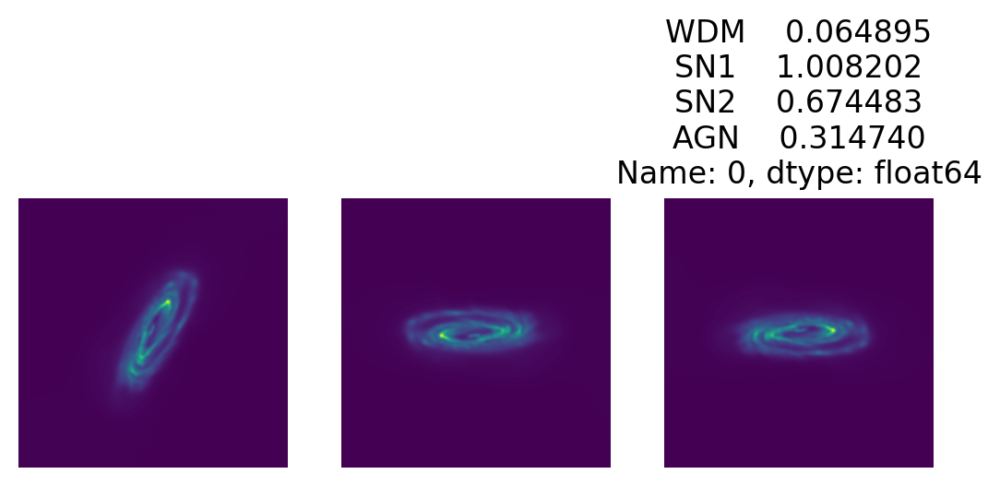

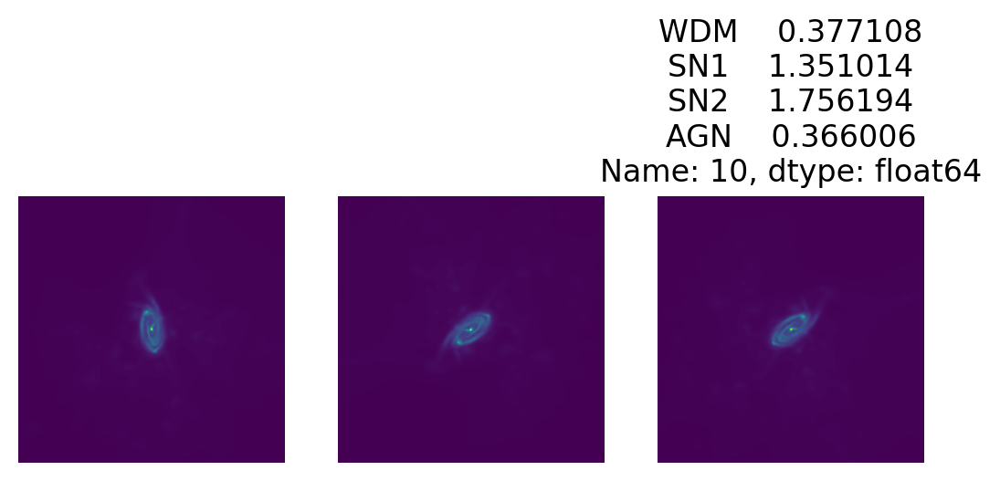

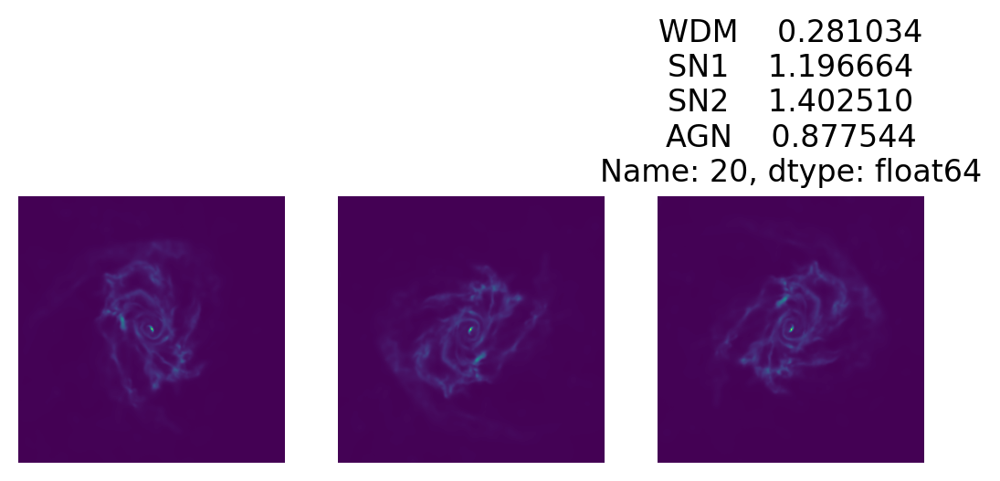

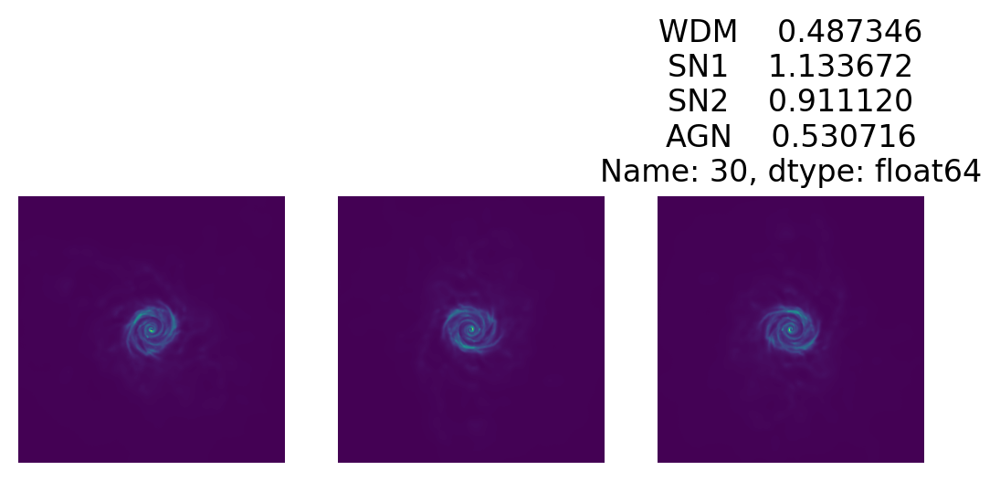

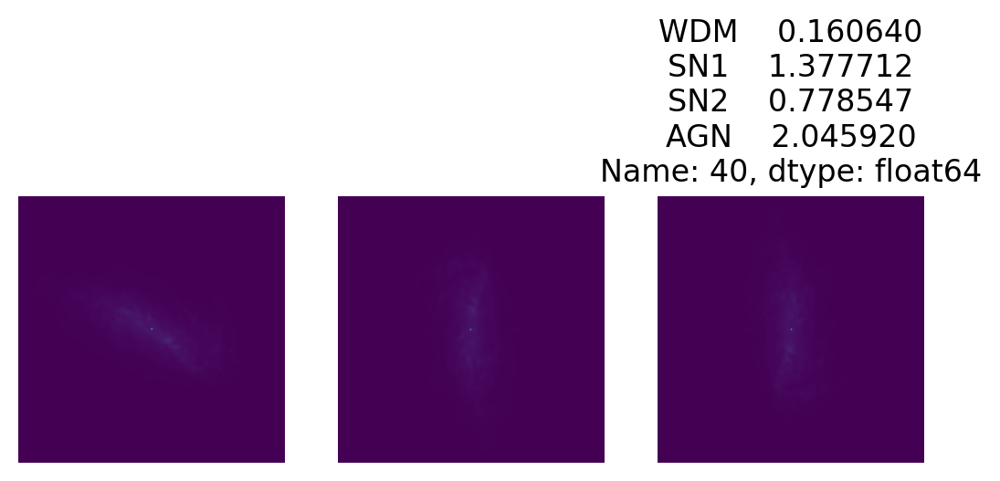

...

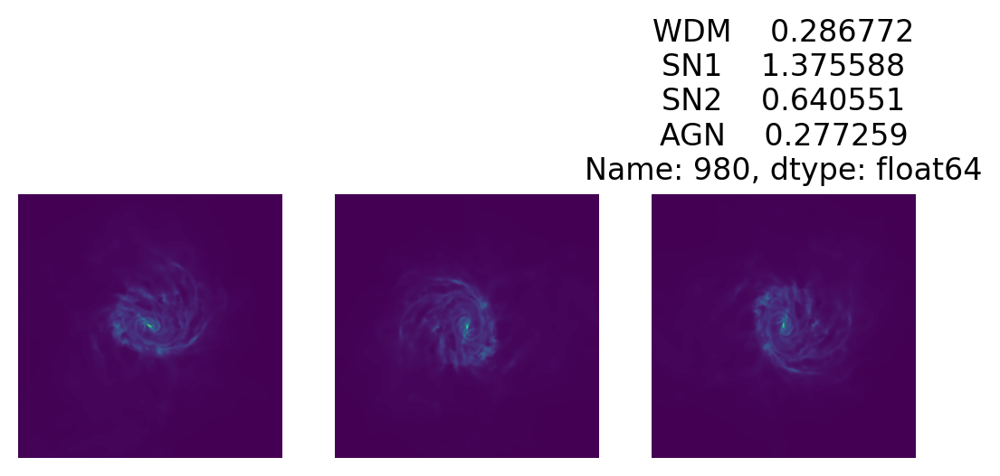

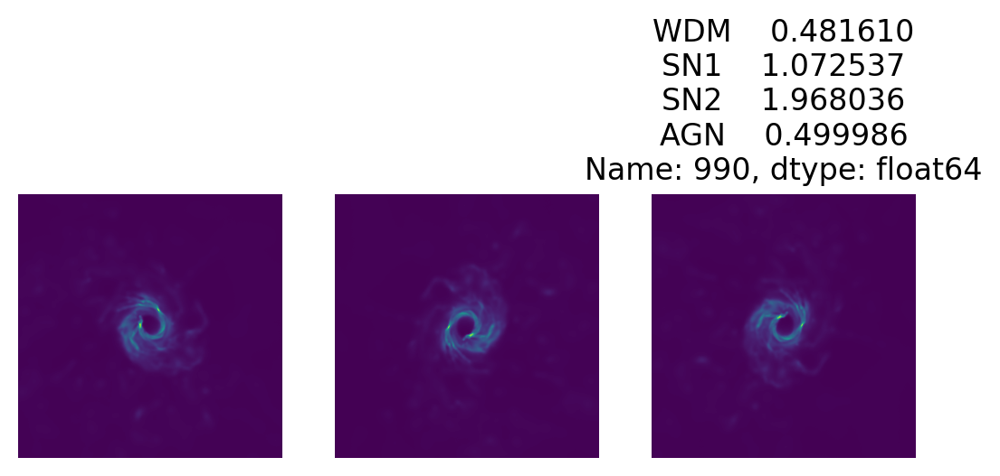

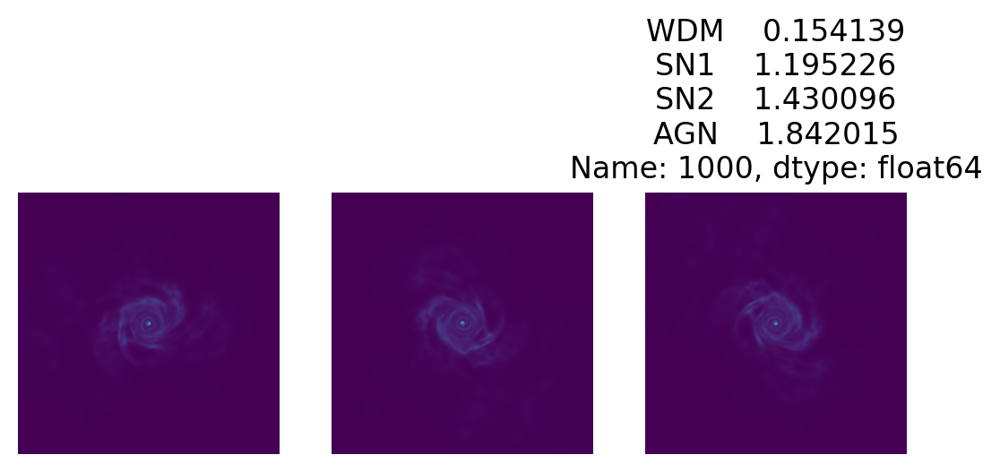

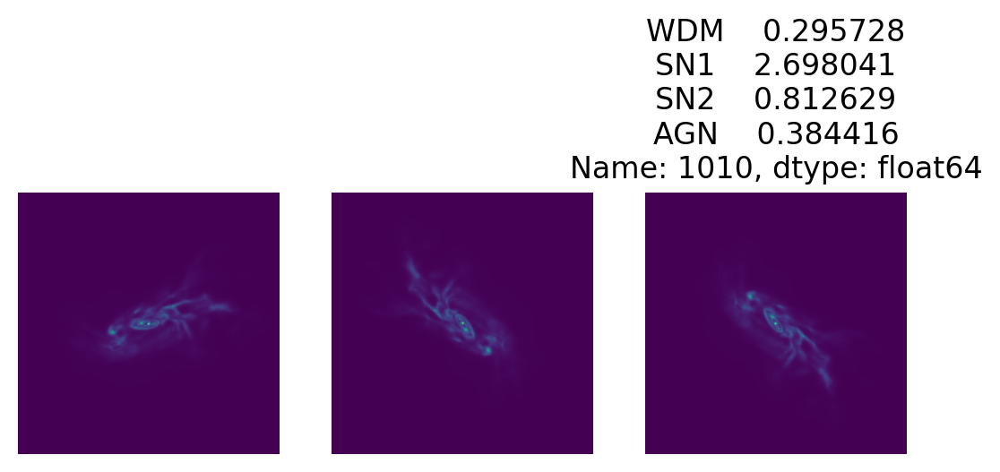

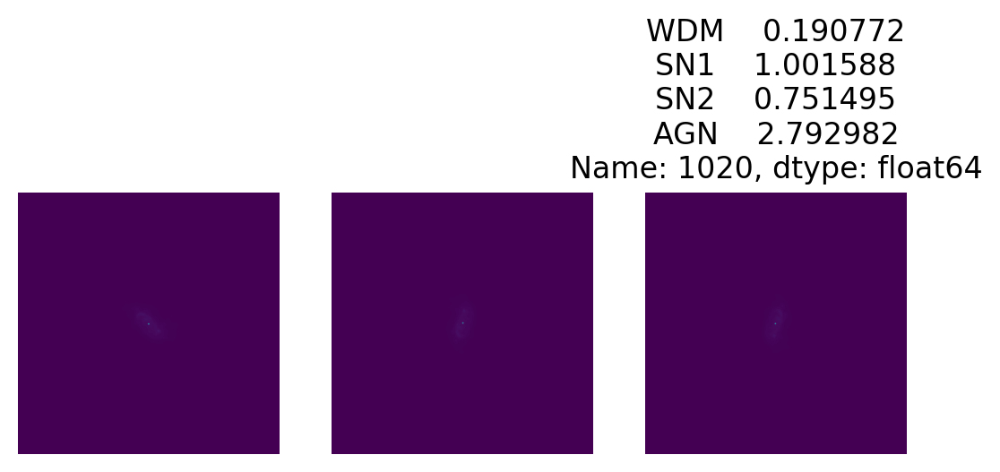

In [134]:
for i in np.arange(0, 1024, 10):

    galaxy_path = "/mnt/ceph/users/fvillaescusa/DREAMS/Software/zoom_images/Galaxy_" + str(i) + ".hdf5"
    sim_params = sim_params_df.iloc[i]
    # print(sim_params)
    file = h5py.File(galaxy_path, 'r')
    # [row, col]
    fig, axs = plt.subplots(1, 3, dpi = 200)
    axs[0].imshow(np.array(file["Mgas_1"]).astype("<f4")) #why did I use f4
    axs[0].axis("off")
    axs[1].imshow(np.array(file["Mgas_2"]).astype("<f4"))
    axs[1].axis("off")
    axs[2].imshow(np.array(file["Mgas_3"]).astype("<f4"))
    axs[2].axis("off")
    plt.title(str(sim_params))
    # save_path = '/mnt/ceph/users/dmohan/testing/'

In [ ]:
galaxy_path = "/mnt/ceph/users/fvillaescusa/DREAMS/\
Software/zoom_images/Galaxy_0.hdf5"

file = h5py.File(galaxy_path, 'r')

In [ ]:
# 1024: split into 70:15:15 for train:val:test
